In [1]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import pandas as pd
import matplotlib.pyplot as plt
from scripts.load_data import *
from scripts.preprocess import *
from scripts.predict_sarima import *
from scripts.helper import *
from scripts.postprocess import *

In [2]:
data = pd.read_excel("//ru.nl/wrkgrp/TeamIR/Man_info/Student Analytics/Prognosemodel RU/Syntax/Python/studentprognose/data/output/output_final.xlsx")
print(data)
print(data.columns)

         index Examentype                                Croho groepeernaam  \
0            0   Bachelor                   B Algemene Cultuurwetenschappen   
1            1   Bachelor                   B Algemene Cultuurwetenschappen   
2            2   Bachelor                   B Algemene Cultuurwetenschappen   
3            3   Bachelor                   B Algemene Cultuurwetenschappen   
4            4   Bachelor                   B Algemene Cultuurwetenschappen   
...        ...        ...                                               ...   
164776  163157     Master  M Wijsbegeerte van een Bepaald Wetenschapsgebied   
164777  163158     Master  M Wijsbegeerte van een Bepaald Wetenschapsgebied   
164778  163159     Master  M Wijsbegeerte van een Bepaald Wetenschapsgebied   
164779  163160     Master  M Wijsbegeerte van een Bepaald Wetenschapsgebied   
164780  163161     Master  M Wijsbegeerte van een Bepaald Wetenschapsgebied   

       Herkomst Faculteit  Collegejaar  Weeknummer 

In [13]:
import json

def print_dict(dict):
    print(json.dumps(dict, sort_keys=True, indent=4))

MAE_metrics = [
    "MAE average ensemble",
    "MAE ensemble",
    "MAE sarima cumulative",
    "MAE sarima individual",
    "MAE ratio"
]

MAPE_metrics = [
    "MAPE average ensemble",
    "MAPE ensemble",
    "MAPE sarima cumulative",
    "MAPE sarima individual",
    "MAPE ratio"
]

programme_stats = {}

for programme in data["Croho groepeernaam"].unique():
    programme_data = data[data["Croho groepeernaam"] == programme]
    programme_stats[programme] = {}

    for year in data["Collegejaar"].unique():
        year_data = programme_data[programme_data["Collegejaar"] == year]
        # print(year_data)
        # year_data = year_data[~np.isnan(year_data["Average_ensemble_prediction"])]

        year = str(year)

        programme_stats[programme][year] = {}

        results_null = True
        for key in MAE_metrics:
            result = np.nanmean(year_data[key])
            if not np.isnan(result):
                programme_stats[programme][year][key] = result
                results_null = False

        for key in MAPE_metrics:
            result = np.nansum(year_data[key]) / len(year_data) * 100
            if not np.isnan(result) and result != 0:
                programme_stats[programme][year][key] = result
                results_null = False

        if results_null:
            programme_stats[programme].pop(year)

print_dict(programme_stats)

{
    "B Algemene Cultuurwetenschappen": {
        "2021": {
            "MAE average ensemble": 2.9167630534085487,
            "MAE ensemble": 2.961841441602278,
            "MAE ratio": 4.254521343870757,
            "MAE sarima cumulative": 4.613333333333333,
            "MAE sarima individual": 3.17844441313025,
            "MAPE average ensemble": 10.26652755553943,
            "MAPE ensemble": 11.8014968830242,
            "MAPE ratio": 13.965306037441582,
            "MAPE sarima cumulative": 17.716622458001765,
            "MAPE sarima individual": 12.066517201125883
        },
        "2022": {
            "MAE average ensemble": 2.2005799308105978,
            "MAE ensemble": 2.0805748444174728,
            "MAE ratio": 4.10430739328944,
            "MAE sarima cumulative": 1.9294871794871795,
            "MAE sarima individual": 2.9765867726287865,
            "MAPE average ensemble": 7.132830814274438,
            "MAPE ensemble": 6.707425362583372,
            "MAPE ratio

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

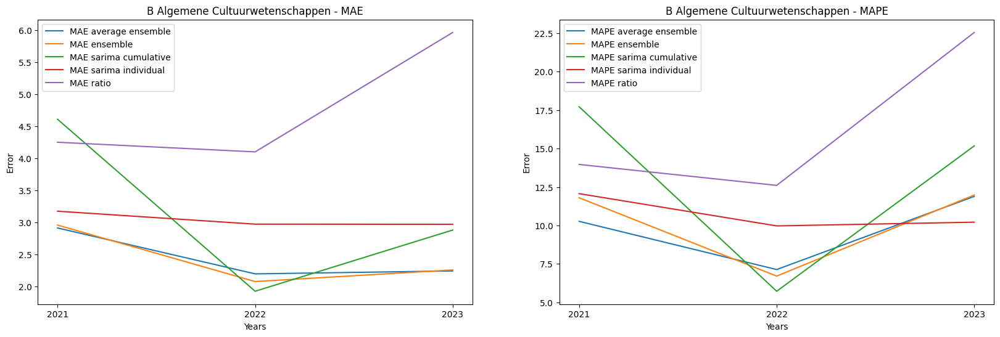

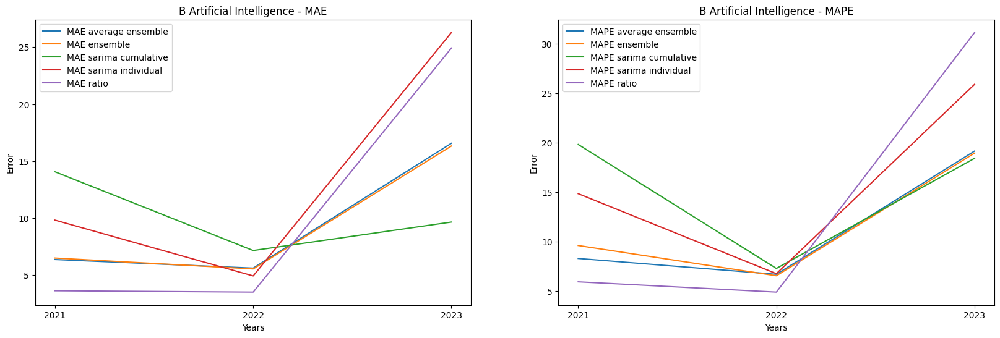

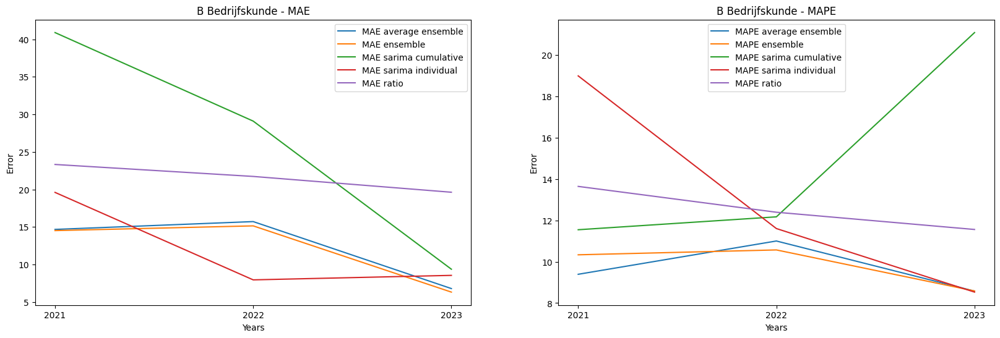

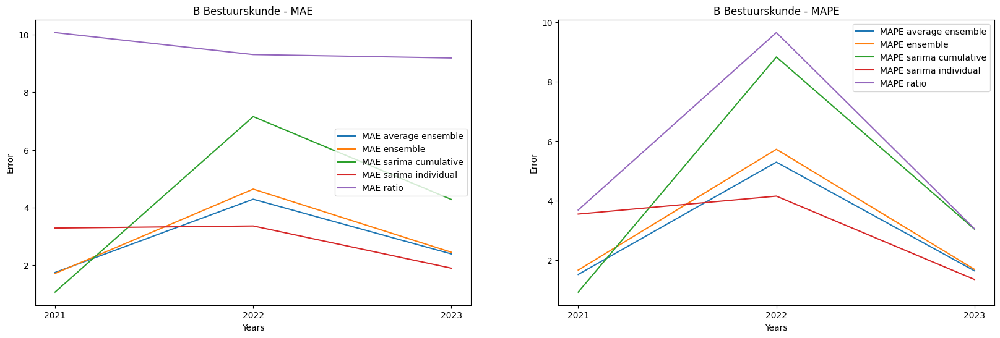

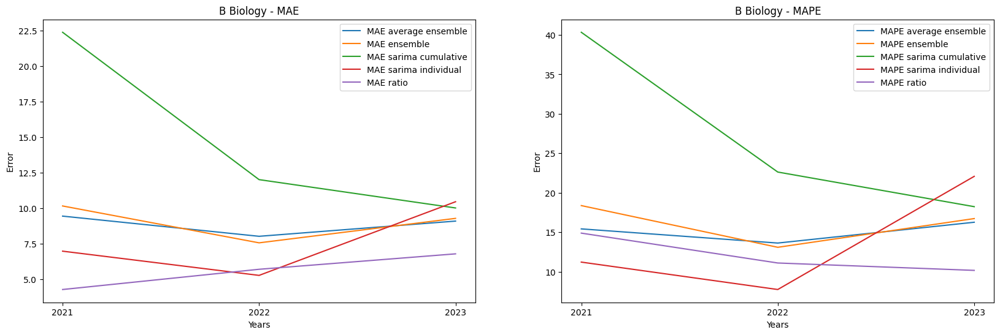

...

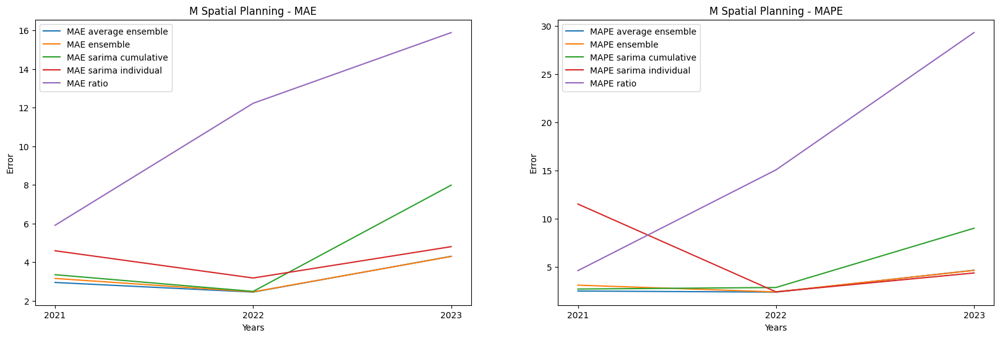

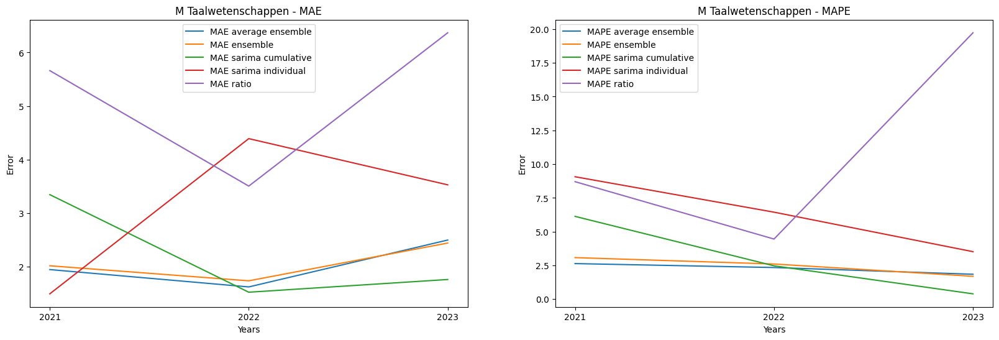

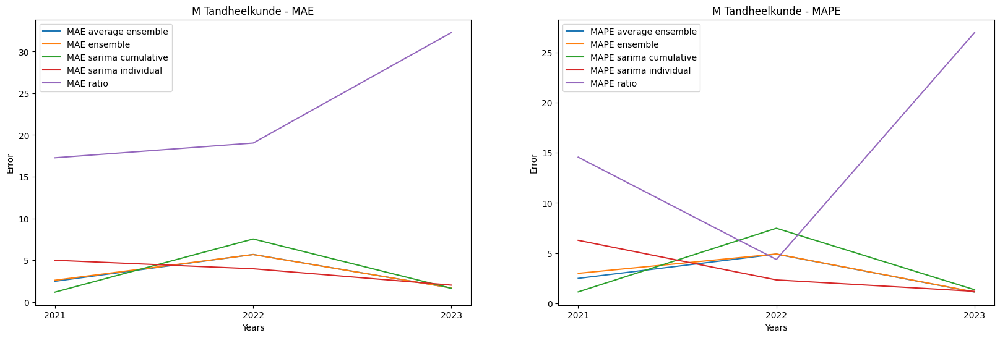

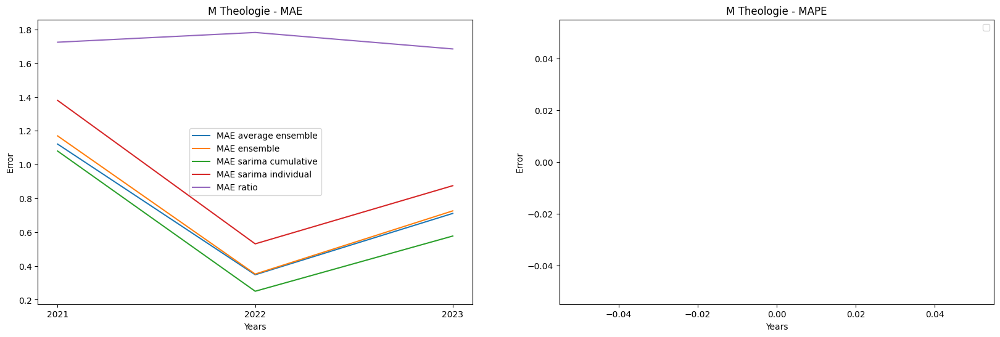

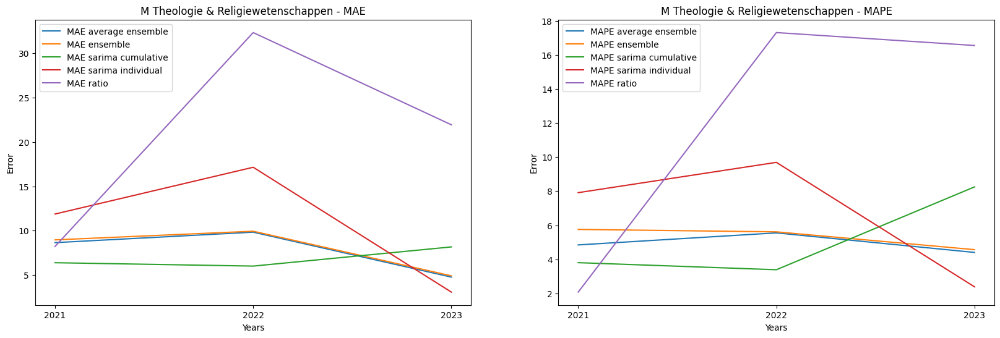

In [24]:
for programme in programme_stats:
    if programme_stats[programme] == {}:
        continue

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))
    for metric in MAE_metrics:
        years = []
        metrics = []
        for year in programme_stats[programme]:
            years.append(year)
            if metric in programme_stats[programme][year]:
                metrics.append(programme_stats[programme][year][metric])

        if len(metrics) != len(years):
            continue
        ax1.plot(years, metrics, label=metric)

    for metric in MAPE_metrics:
        years = []
        metrics = []
        for year in programme_stats[programme]:
            years.append(year)
            if metric in programme_stats[programme][year]:
                metrics.append(programme_stats[programme][year][metric])

        if len(metrics) != len(years):
            continue
        ax2.plot(years, metrics, label=metric)

    # for i, metric in enumerate(programme_stats[programme][list(programme_stats[programme].keys())[0]]):
    #     if metric not in programme_stats[programme][year]:
    #         continue

    #     years = []
    #     metrics = []
    #     for year in programme_stats[programme]:
    #         years.append(year)
    #         metrics.append(programme_stats[programme][year][metric])
    #     if i < 5:
    #         ax1.plot(years, metrics, label=metric)
    #     else:
    #         ax2.plot(years, metrics, label=metric)

    ax1.set_title(programme + " - MAE")
    ax1.set_xlabel("Years")
    ax1.set_ylabel("Error")
    ax2.set_title(programme + " - MAPE")
    ax2.set_xlabel("Years")
    ax2.set_ylabel("Error")
    ax1.legend()
    ax2.legend()
    ax1.plot()
    ax2.plot()